In [12]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
# from cv2 import imread, resize, cvtColor, COLOR_RGB2GRAY, GaussianBlur, Laplacian, CV_64F, normalize
# from PIL import Image
# from sklearn.manifold import TSNE
from tqdm import tqdm

from src.image_diagnostics import *

In [3]:
DATA_DIR = Path('../../../../data/Streamflow/fpe_stations')
stations = sorted([f.stem for f in DATA_DIR.iterdir() if f.stem not in ['FOXRC', 'GREENR', 'LANESV', 'WESTKILL', 'VLYB']])


In [4]:
def open_and_resize_image(image_path):
    image = cv2.imread(str(image_path))
    image = standardize_image_array(image, is_bgr=True) # opencv reads images in BGR format
    image = image[int(image.shape[0] * 0.05):int(image.shape[0] * 0.85), :, :] # leave out the bottom 15% and top 5% of the image
    aspect_ratio = image.shape[1] / image.shape[0]
    new_width = 512
    new_height = int(new_width / aspect_ratio)
    image_small = cv2.resize(image, (new_width, new_height))
    return image_small

In [5]:
grayscale = []
c1_mean = []
c2_mean = []
c3_mean = []
haze = []
mal = []
var_laplacian = []
frac_dark = []
frac_light = []
image_paths = []
stations_list = []

for station in stations:
    station_images = pd.read_csv(DATA_DIR / station / 'FLOW_CFS' / 'images.csv')
    station_images_sample = station_images.sample(200)

    for i in tqdm(range(200)):
        image_path = DATA_DIR / station / 'FLOW_CFS' / station_images_sample.iloc[i]['filename']
        image = open_and_resize_image(image_path)
        image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        image_is_grayscale = is_grayscale(image)
        grayscale.append(image_is_grayscale)
        c1_mean.append(image[:, :, 0].mean())
        c2_mean.append(image[:, :, 1].mean())
        c3_mean.append(image[:, :, 2].mean())
        haze.append(haze_score(image))
        mal.append(mean_absolute_lightness(image))
        var_laplacian.append(variance_of_laplacian(image_gray))
        frac_dark.append((image_gray < 30).mean())
        frac_light.append((image_gray > 225).mean())
        image_paths.append(image_path)
        stations_list.append(station)
        

image_properties = {
    'station': stations_list,
    'image_paths': image_paths,
    'grayscale': grayscale,
    'c1_mean': c1_mean,
    'c2_mean': c2_mean,
    'c3_mean': c3_mean,
    'haze': haze,
    'mal': mal,
    'var_laplacian': var_laplacian,
    'frac_dark': frac_dark,
    'frac_light': frac_light,
}
image_properties_df = pd.DataFrame(image_properties)

100%|██████████| 200/200 [00:15<00:00, 12.60it/s]


In [6]:
# get fraction grayscale images
num_grayscale = image_properties_df['grayscale'].sum()
frac_grayscale = num_grayscale / image_properties_df.shape[0]
print(f'Fraction of grayscale images: {frac_grayscale}')

Fraction of grayscale images: 0.515


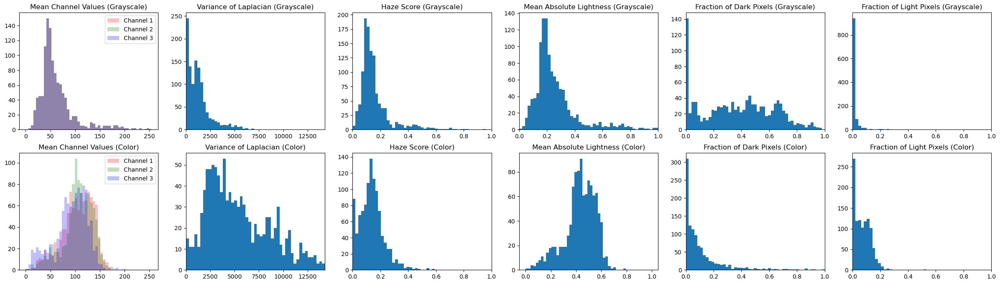

In [7]:
grayscale_image_properties_df = image_properties_df[image_properties_df['grayscale']]
color_image_properties_df = image_properties_df[~image_properties_df['grayscale']]
max_x_var_laplacian = max(image_properties_df['var_laplacian'])

# plot histograms of each quantity for grayscale and color images
fig, ax = plt.subplots(2,6, figsize=(30,8))
channel_bins = np.linspace(0, 255, 50)
zeroone_bins = np.linspace(0, 1, 50)
varlaplacian_bins = np.linspace(0, max_x_var_laplacian, 50)
for i, df in enumerate([grayscale_image_properties_df, color_image_properties_df]):
    lab = 'Grayscale' if i == 0 else 'Color'
    # color image properties
    ax[i,0].hist(df['c1_mean'], bins=channel_bins, alpha=0.25, color='r', label='Channel 1')
    ax[i,0].hist(df['c2_mean'], bins=channel_bins, alpha=0.25, color='g', label='Channel 2')
    ax[i,0].hist(df['c3_mean'], bins=channel_bins, alpha=0.25, color='b', label='Channel 3')
    ax[i,0].legend()
    ax[i,0].set_title(f'Mean Channel Values ({lab})')

    ax[i,1].hist(df['var_laplacian'], bins=varlaplacian_bins)
    ax[i,1].set_xlim(0, max_x_var_laplacian)
    ax[i,1].set_title(f'Variance of Laplacian ({lab})')
    
    ax[i,2].hist(df['haze'], bins=zeroone_bins)
    ax[i,2].set_xlim(0, 1.0)
    ax[i,2].set_title(f'Haze Score ({lab})')
    
    ax[i,3].hist(df['mal'], bins=zeroone_bins)
    ax[0,3].set_xlim(0, 1.0)
    ax[i,3].set_title(f'Mean Absolute Lightness ({lab})')
    
    ax[i,4].hist(df['frac_dark'], bins=zeroone_bins)
    ax[i,4].set_xlim(0, 1.0)
    ax[i,4].set_title(f'Fraction of Dark Pixels ({lab})')
    
    ax[i,5].hist(df['frac_light'], bins=zeroone_bins)
    ax[i,5].set_xlim(0, 1.0)
    ax[i,5].set_title(f'Fraction of Light Pixels ({lab})')

plt.show()


../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/50ba668d-aedb-4d59-903a-3dda9596a754/images/West Brook Upper__2022-06-23__16-29-06(1).JPG 0.00011855363845825195
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/50ba668d-aedb-4d59-903a-3dda9596a754/images/West Brook Upper__2022-07-19__15-07-32(26).JPG 0.5840833187103271
../../../../data/Streamflow/fpe_stations/West Brook Reservoir_01171020/FLOW_CFS/imagesets/8120a6f9-ea63-432f-82d2-84bb1a496e7c/images/West Brook Reservior__2022-07-10__15-45-14(1).JPG 0.0002435445785522461
../../../../data/Streamflow/fpe_stations/Avery Brook_River Right_01171000/FLOW_CFS/imagesets/14bc05de-1125-4c58-b50c-2c969adf674b/images/Avery River Right__2022-12-07__12-15-00(1).JPG 0.54461270570755
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/805a8dcf-6148-4965-b823-df22b4d4f866/images/West Brook Upper__2021-07-16__14-14-49(1).JPG 0.00040799379348754883

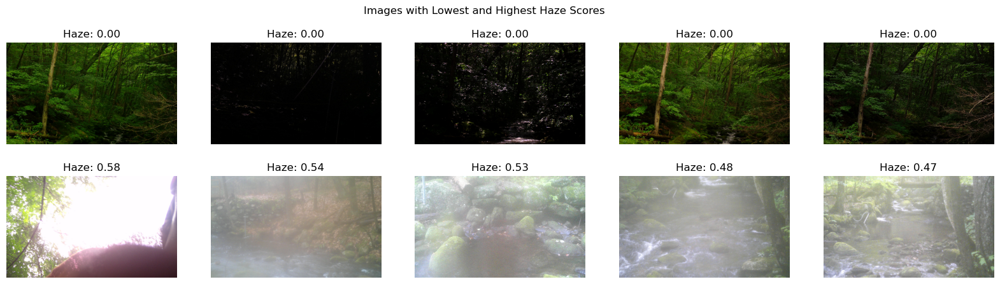

../../../../data/Streamflow/fpe_stations/West Brook Reservoir_01171020/FLOW_CFS/imagesets/8120a6f9-ea63-432f-82d2-84bb1a496e7c/images/West Brook Reservior__2022-07-10__15-45-14(1).JPG 0.011501270398224437
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/50ba668d-aedb-4d59-903a-3dda9596a754/images/West Brook Upper__2022-07-19__15-07-32(26).JPG 0.7792668864166188
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/910a0767-ea4c-4303-8858-677fff1de71f/images/West Brook Upper__2021-03-20__02-44-03(1).JPG 0.033150832095867645
../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/5a3a7cba-5fb4-4fd7-a0fa-a77e084e99c9/images/Avery Side__2022-09-13__10-30-00(1).JPG 0.7022300079437314
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/805a8dcf-6148-4965-b823-df22b4d4f866/images/West Brook Upper__2021-07-16__14-14-49(1).JPG 0.04254002802260969
../../../../data/

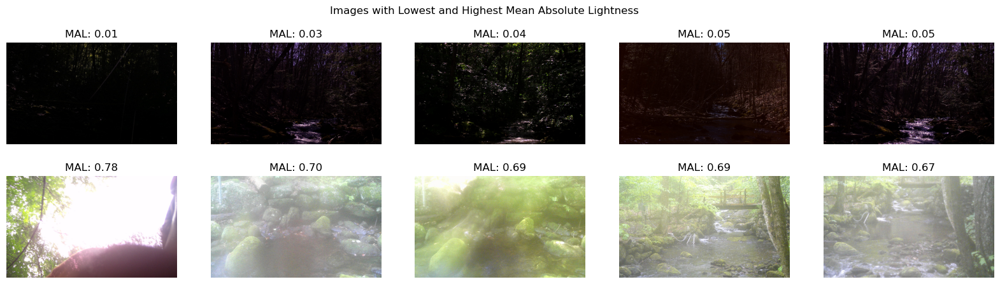

../../../../data/Streamflow/fpe_stations/West Branch Swift River_01174565/FLOW_CFS/imagesets/149ec5ca-6f26-4f15-a9d9-d9c979439645/images/IMAG2659.JPG 21.2227167865083
../../../../data/Streamflow/fpe_stations/Sanderson Brook_01171010/FLOW_CFS/imagesets/20f7ea02-458d-4c21-8d9d-57e9b44a0e34/images/Sanderson__2021-06-26__16-00-00(1).JPG 14278.902772919937
../../../../data/Streamflow/fpe_stations/West Branch Swift River_01174565/FLOW_CFS/imagesets/b2eb4fe1-17d3-4f3a-8609-4d9dcebea954/images/RCNX0863.JPG 45.01168974663741
../../../../data/Streamflow/fpe_stations/Sanderson Brook_01171010/FLOW_CFS/imagesets/30b0c566-0fd0-4c2e-a74d-2ebf07f6b8d3/images/Sanderson__2021-08-04__15-45-02(1).JPG 14140.914878241414
../../../../data/Streamflow/fpe_stations/Avery Brook_River Right_01171000/FLOW_CFS/imagesets/14bc05de-1125-4c58-b50c-2c969adf674b/images/Avery River Right__2022-12-07__12-15-00(1).JPG 91.64970676609232
../../../../data/Streamflow/fpe_stations/Sanderson Brook_01171010/FLOW_CFS/imagesets/f5ee

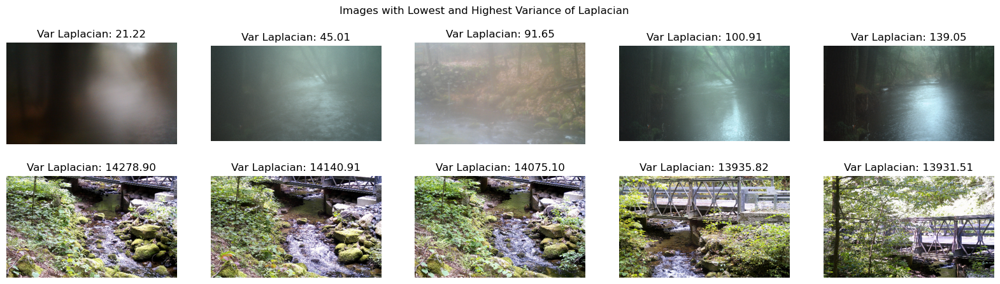

../../../../data/Streamflow/fpe_stations/West Brook Reservoir_01171020/FLOW_CFS/imagesets/5371f2af-a823-4941-8255-458de01c7059/images/West Brook Reservior__2021-11-12__15-00-00(1).JPG 0.0
../../../../data/Streamflow/fpe_stations/West Brook Reservoir_01171020/FLOW_CFS/imagesets/8120a6f9-ea63-432f-82d2-84bb1a496e7c/images/West Brook Reservior__2022-07-10__15-45-14(1).JPG 0.9827336115635179
../../../../data/Streamflow/fpe_stations/West Brook Lower_01171090/FLOW_CFS/imagesets/80ea2fb2-f762-476d-8917-8f477ed013f5/images/West Brook Lower__2022-03-20__08-15-03(1).JPG 0.0
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/910a0767-ea4c-4303-8858-677fff1de71f/images/West Brook Upper__2021-03-20__02-44-03(1).JPG 0.9271045399022801
../../../../data/Streamflow/fpe_stations/West Brook 0_01171100/FLOW_CFS/imagesets/28817548-7828-4365-9263-af78ce15b503/images/RCNX2031.JPG 0.0
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/805a8

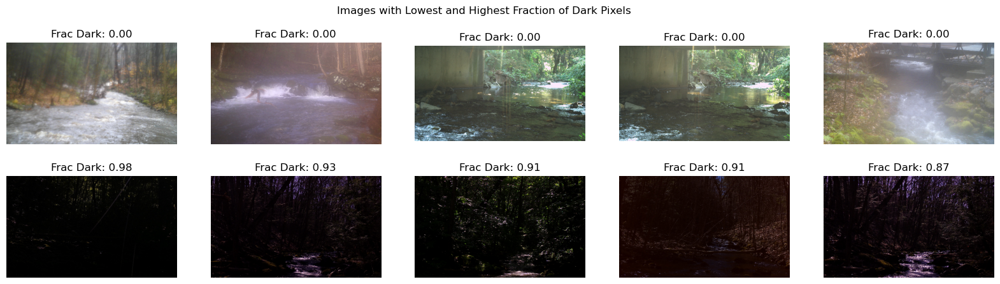

../../../../data/Streamflow/fpe_stations/West Whately_01171005/FLOW_CFS/imagesets/de1ff735-1b05-473b-97d7-4148cd10a295/images/02250442.JPG 0.0
../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/50ba668d-aedb-4d59-903a-3dda9596a754/images/West Brook Upper__2022-07-19__15-07-32(26).JPG 0.5174381616449512
../../../../data/Streamflow/fpe_stations/West Branch Swift River_01174565/FLOW_CFS/imagesets/e3007b92-3c68-43bc-9191-2a4d56815703/images/RCNX4262.JPG 0.0
../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/87922f0a-b450-4b07-a1e2-532749ed93de/images/Avery Side__2022-12-15__08-00-00(1).JPG 0.2654913986156352
../../../../data/Streamflow/fpe_stations/West Branch Swift River_01174565/FLOW_CFS/imagesets/b2eb4fe1-17d3-4f3a-8609-4d9dcebea954/images/RCNX0863.JPG 0.0
../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/78c8c019-b49c-460f-b9af-2dacbfa020f4/images/Avery Side__2021-06-05__14-59-59(1

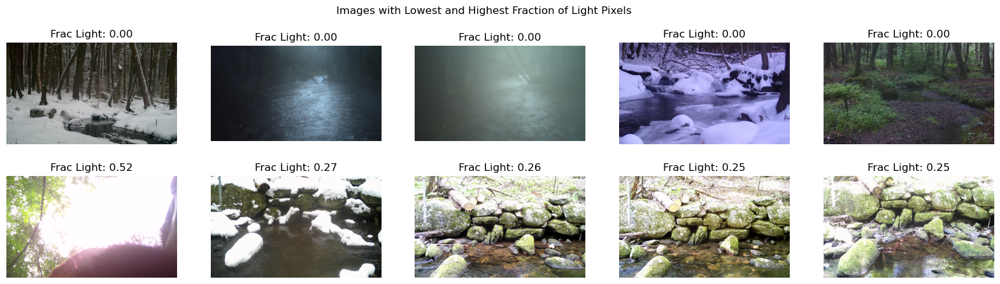

In [8]:
# plot 5 images with lowest haze score and 5 images with highest haze score
sorted_indices = color_image_properties_df['haze'].argsort().values
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i in range(5):
    ax[0,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[i]]['image_paths']))
    ax[0,i].set_title(f'Haze: {color_image_properties_df.iloc[sorted_indices[i]]["haze"]:.2f}')
    ax[0,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[i]]['image_paths'], color_image_properties_df.iloc[sorted_indices[i]]['haze'])
    ax[1,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths']))
    ax[1,i].set_title(f'Haze: {color_image_properties_df.iloc[sorted_indices[-i-1]]["haze"]:.2f}')
    ax[1,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths'], color_image_properties_df.iloc[sorted_indices[-i-1]]['haze'])
plt.suptitle('Images with Lowest and Highest Haze Scores')
plt.show()

# plot 5 images with lowest mean absolute lightness and 5 images with highest mean absolute lightness
sorted_indices = color_image_properties_df['mal'].argsort().values
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i in range(5):
    ax[0,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[i]]['image_paths']))
    ax[0,i].set_title(f'MAL: {color_image_properties_df.iloc[sorted_indices[i]]["mal"]:.2f}')
    ax[0,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[i]]['image_paths'], color_image_properties_df.iloc[sorted_indices[i]]['mal'])
    ax[1,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths']))
    ax[1,i].set_title(f'MAL: {color_image_properties_df.iloc[sorted_indices[-i-1]]["mal"]:.2f}')
    ax[1,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths'], color_image_properties_df.iloc[sorted_indices[-i-1]]['mal'])
plt.suptitle('Images with Lowest and Highest Mean Absolute Lightness')
plt.show()

# plot 5 images with lowest variance of laplacian and 5 images with highest variance of laplacian
sorted_indices = color_image_properties_df['var_laplacian'].argsort().values
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i in range(5):
    ax[0,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[i]]['image_paths']))
    ax[0,i].set_title(f'Var Laplacian: {color_image_properties_df.iloc[sorted_indices[i]]["var_laplacian"]:.2f}')
    ax[0,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[i]]['image_paths'], color_image_properties_df.iloc[sorted_indices[i]]['var_laplacian'])
    ax[1,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths']))
    ax[1,i].set_title(f'Var Laplacian: {color_image_properties_df.iloc[sorted_indices[-i-1]]["var_laplacian"]:.2f}')
    ax[1,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths'], color_image_properties_df.iloc[sorted_indices[-i-1]]['var_laplacian'])
plt.suptitle('Images with Lowest and Highest Variance of Laplacian')
plt.show()

# plot 5 images with lowest fraction of dark pixels and 5 images with highest fraction of dark pixels
sorted_indices = color_image_properties_df['frac_dark'].argsort().values
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i in range(5):
    ax[0,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[i]]['image_paths']))
    ax[0,i].set_title(f'Frac Dark: {color_image_properties_df.iloc[sorted_indices[i]]["frac_dark"]:.2f}')
    ax[0,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[i]]['image_paths'], color_image_properties_df.iloc[sorted_indices[i]]['frac_dark'])
    ax[1,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths']))
    ax[1,i].set_title(f'Frac Dark: {color_image_properties_df.iloc[sorted_indices[-i-1]]["frac_dark"]:.2f}')
    ax[1,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths'], color_image_properties_df.iloc[sorted_indices[-i-1]]['frac_dark'])
plt.suptitle('Images with Lowest and Highest Fraction of Dark Pixels')
plt.show()

# plot 5 images with lowest fraction of light pixels and 5 images with highest fraction of light pixels
sorted_indices = color_image_properties_df['frac_light'].argsort().values
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i in range(5):
    ax[0,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[i]]['image_paths']))
    ax[0,i].set_title(f'Frac Light: {color_image_properties_df.iloc[sorted_indices[i]]["frac_light"]:.2f}')
    ax[0,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[i]]['image_paths'], color_image_properties_df.iloc[sorted_indices[i]]['frac_light'])
    ax[1,i].imshow(open_and_resize_image(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths']))
    ax[1,i].set_title(f'Frac Light: {color_image_properties_df.iloc[sorted_indices[-i-1]]["frac_light"]:.2f}')
    ax[1,i].axis('off')
    # print the filename and value
    print(color_image_properties_df.iloc[sorted_indices[-i-1]]['image_paths'], color_image_properties_df.iloc[sorted_indices[-i-1]]['frac_light'])
plt.suptitle('Images with Lowest and Highest Fraction of Light Pixels')
plt.show()

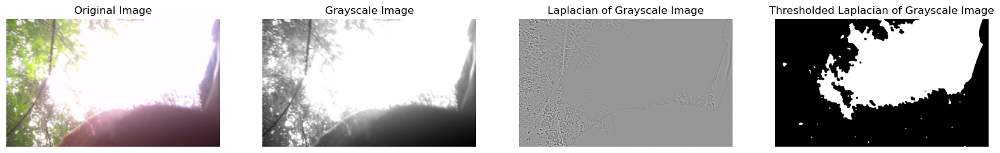

True


In [22]:
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/be31e3ca-62d2-45d4-a006-a8b0a938c293/images/Avery Side__2022-11-10__12-17-08(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Whately_01171005/FLOW_CFS/imagesets/03d970b4-7e0f-4ee5-b895-39222ac214d8/images/West Whately__2022-02-25__10-45-17(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/d4890358-0efa-4c7e-a01c-bf295da56bb2/images/Avery Side__2022-02-23__11-15-01(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Branch Swift River_01174565/FLOW_CFS/imagesets/149ec5ca-6f26-4f15-a9d9-d9c979439645/images/IMAG2208.JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Brook 0_01171100/FLOW_CFS/imagesets/b94e847f-43c3-43cd-973a-14f0c5af29ad/images/West Brook Master__2022-09-23__15-15-00(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Whately_01171005/FLOW_CFS/imagesets/03d970b4-7e0f-4ee5-b895-39222ac214d8/images/West Whately__2022-02-25__10-45-17(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Brook Lower_01171090/FLOW_CFS/imagesets/0e363e80-529c-4667-ad73-9297b594282b/images/West Brook Lower__2022-12-07__08-30-05(1).JPG'

# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Brook 0_01171100/FLOW_CFS/imagesets/ebfbde2f-222f-4687-9d62-05647f70914b/images/West Brook Master__2022-03-16__15-45-01(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/5a3a7cba-5fb4-4fd7-a0fa-a77e084e99c9/images/Avery Side__2022-09-19__10-14-59(1).JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Brook Reservoir_01171020/FLOW_CFS/imagesets/89a177b7-d224-4ec9-a189-01eddfa1cf8d/images/03050180.JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/Avery Brook_Side_01171000/FLOW_CFS/imagesets/6b2fe5a4-982a-4e56-b8d4-8ff49485028d/images/01220302.JPG'
# bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/Avery Brook_River Right_01171000/FLOW_CFS/imagesets/e381a47d-a922-40eb-91bd-48899a55e4d7/images/Avery River Right__2022-10-06__10-30-01(1).JPG'
bright_spot_img_f = '../../../../data/Streamflow/fpe_stations/West Brook Upper_01171030/FLOW_CFS/imagesets/50ba668d-aedb-4d59-903a-3dda9596a754/images/West Brook Upper__2022-07-19__15-07-32(26).JPG'

bright_spot_img = open_and_resize_image(bright_spot_img_f)
bright_spot_img = cv2.GaussianBlur(bright_spot_img, (3, 3), 0)
bright_spot_img_gray = cv2.cvtColor(bright_spot_img, cv2.COLOR_RGB2GRAY)

bright_spot_img_gray_laplacian = cv2.Laplacian(bright_spot_img_gray, cv2.CV_64F, ksize=3)
bright_spot_img_gray_laplacian_abs = np.abs(bright_spot_img_gray_laplacian)
# normalize
bright_spot_img_gray_laplacian_abs = cv2.normalize(bright_spot_img_gray_laplacian_abs, None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_64F)

# binary threshold the laplacian image
bright_spot_img_gray_laplacian_thresh = np.zeros_like(bright_spot_img_gray_laplacian_abs)
bright_spot_img_gray_laplacian_thresh[bright_spot_img_gray_laplacian_abs < 0.001] = 1
binary = np.uint8(bright_spot_img_gray_laplacian_thresh)

# use morphological operations to remove small regions
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

# get regions of connected pixels with value 1
num_labels, labels = cv2.connectedComponents(binary)

# count the number of pixels in each connected component
label_counts = np.bincount(labels.flatten())

# return True if any connected component (ignoring the background) has more than 100 pixels, False otherwise
has_large_component = np.any(label_counts[1:] > 100)


# plot the original image, grayscale image, and laplacian of grayscale image
fig, ax = plt.subplots(1,4, figsize=(20,5))
ax[0].imshow(bright_spot_img)
ax[0].set_title('Original Image')
ax[0].axis('off')
ax[1].imshow(bright_spot_img_gray, cmap='gray')
ax[1].set_title('Grayscale Image')
ax[1].axis('off')
ax[2].imshow(bright_spot_img_gray_laplacian, cmap='gray')
ax[2].set_title('Laplacian of Grayscale Image')
ax[2].axis('off')
ax[3].imshow(binary, cmap='gray')
ax[3].set_title('Thresholded Laplacian of Grayscale Image')
ax[3].axis('off')
plt.show()

print(has_large_component)


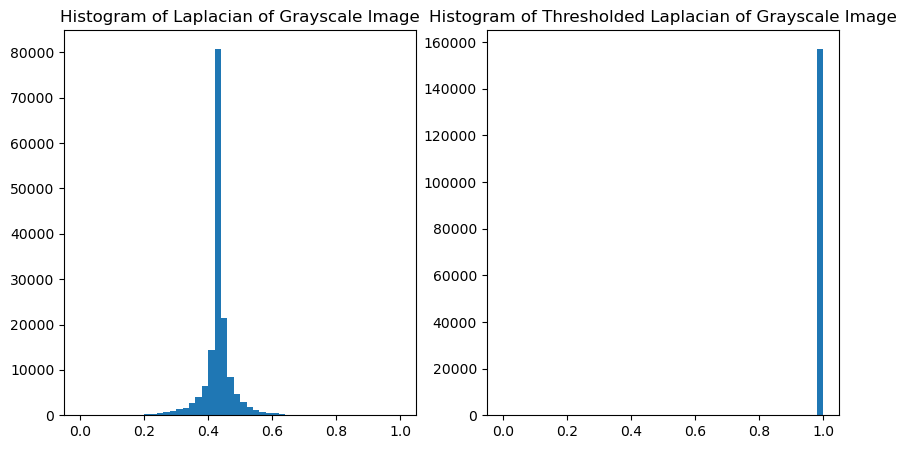

In [34]:
# histogram values in bright_spot_img_gray_laplacian
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].hist(bright_spot_img_gray_laplacian.flatten(), bins=50)
ax[0].set_title('Histogram of Laplacian of Grayscale Image')
ax[1].hist(bright_spot_img_gray_laplacian_thresh.flatten(), bins=50)
ax[1].set_title('Histogram of Thresholded Laplacian of Grayscale Image')
plt.show()

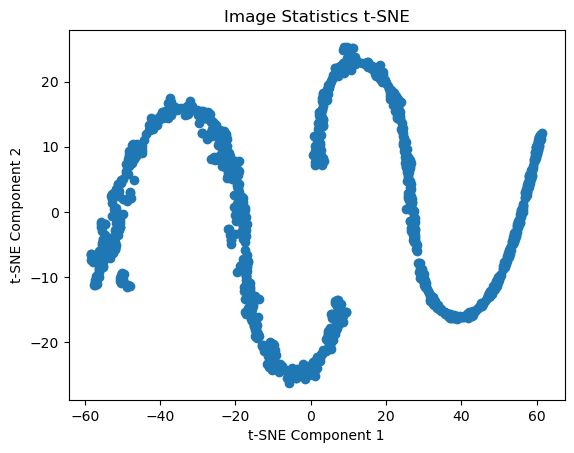

/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


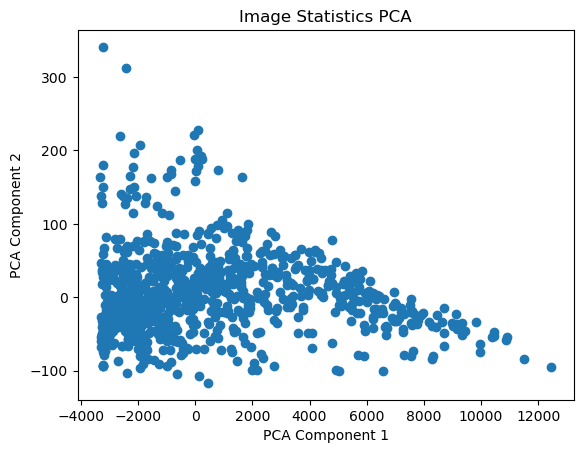

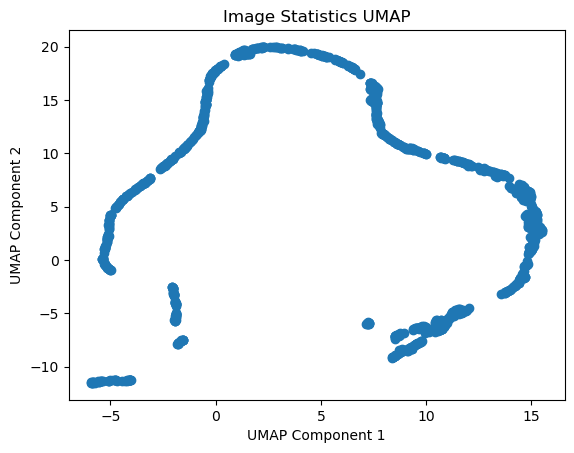

In [10]:
# create t-SNE plot of image statistics
X = image_properties_df[['c1_mean', 'c2_mean', 'c3_mean', 'var_laplacian', 'haze', 'mal', 'frac_dark', 'frac_light']].values
X_tsne = TSNE(n_components=2).fit_transform(X)
plt.scatter(X_tsne[:,0], X_tsne[:,1])
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('Image Statistics t-SNE')
plt.show()

from sklearn.decomposition import PCA
from umap import UMAP

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
plt.scatter(X_pca[:,0], X_pca[:,1])
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Image Statistics PCA')
plt.show()

# UMAP
umap = UMAP(n_components=2)
X_umap = umap.fit_transform(X)
plt.scatter(X_umap[:,0], X_umap[:,1])
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('Image Statistics UMAP')
plt.show()

/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppre

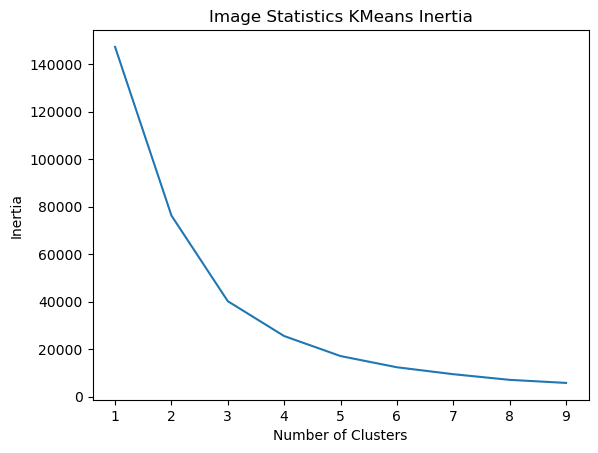

In [11]:
# cluster X with k means, varying number of clusters to find optimal number
from sklearn.cluster import KMeans
inertia = []
for n_clusters in range(1, 10):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(X_umap)
    inertia.append(kmeans.inertia_)
plt.plot(range(1, 10), inertia)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title(f'Image Statistics KMeans Inertia')
plt.show()


/opt/conda/envs/fpe-model.dev-amrita/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


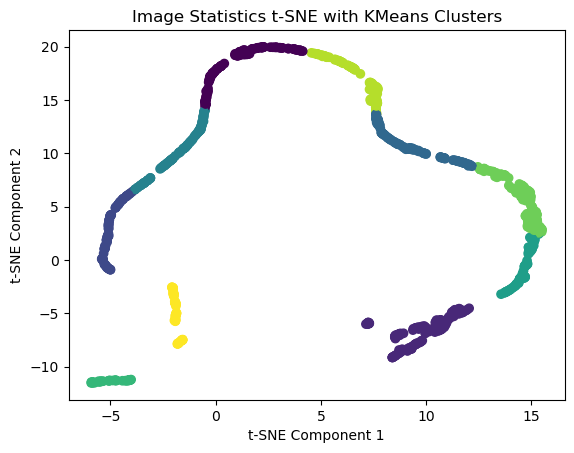

In [12]:
# 2 clusters seems to be the optimal number
kmeans = KMeans(n_clusters=10)
kmeans.fit(X_umap)
cluster_labels = kmeans.predict(X_umap)
plt.scatter(X_umap[:,0], X_umap[:,1], c=cluster_labels)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'Image Statistics t-SNE with KMeans Clusters')
plt.show()

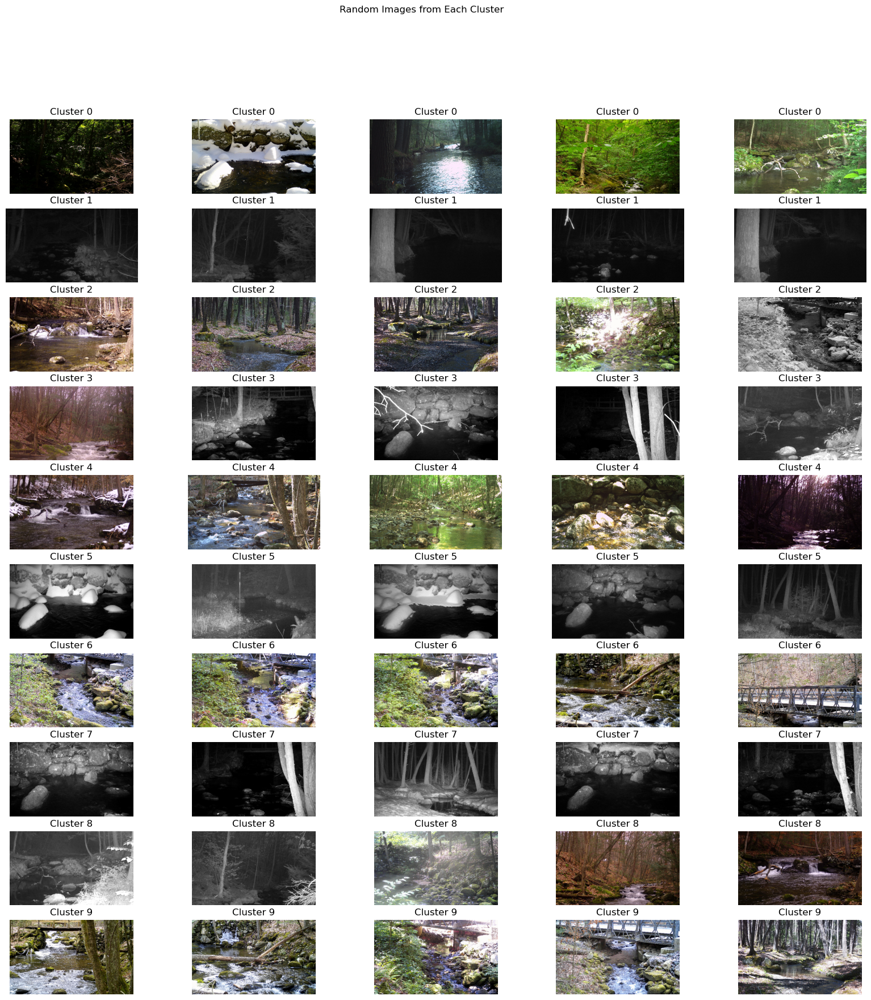

In [13]:
# plot 5 random images from each cluster
fig, ax = plt.subplots(10,5, figsize=(20,20))
np.random.seed(0)  # for reproducibility
for i in range(10):
    cluster_indices = np.where(cluster_labels == i)[0]
    random_indices = np.random.choice(cluster_indices, size=5, replace=False)
    for j, index in enumerate(random_indices):
        ax[i,j].imshow(open_and_resize_image(image_properties_df.iloc[index]['image_paths']))
        ax[i,j].set_title(f'Cluster {i}')
        ax[i,j].axis('off')
plt.suptitle('Random Images from Each Cluster')
plt.show()

Number of bad images: 51


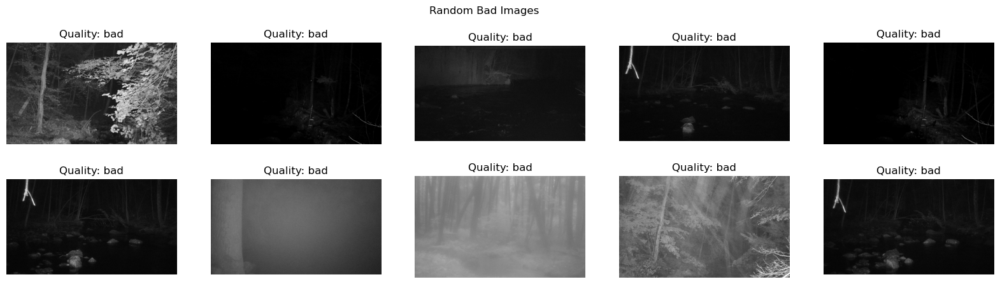

In [99]:
image_properties_df['image_quality'] = None
image_properties_df.loc[image_properties_df['haze'] > 0.5, 'image_quality'] = 'bad' # hazy
image_properties_df.loc[image_properties_df['var_laplacian'] < 50, 'image_quality'] = 'bad' # blurry
image_properties_df.loc[image_properties_df['frac_light'] > 0.95, 'image_quality'] = 'bad' # overexposed
image_properties_df.loc[image_properties_df['frac_dark'] > 0.95, 'image_quality'] = 'bad' # underexposed

bad_indices = [21, 953, 105, 988, 169, 882, 926, 969, 146, 971, 927, 921, 103]
image_properties_df.loc[bad_indices, 'image_quality'] = 'bad'

num_bad_images = image_properties_df['image_quality'].value_counts()['bad']
print(f'Number of bad images: {num_bad_images}')

# visualize 10 random bad images
bad_images = image_properties_df[image_properties_df['image_quality'] == 'bad']
random_indices = np.random.choice(bad_images.index, size=10, replace=False)
fig, ax = plt.subplots(2,5, figsize=(20,5))
for i, index in enumerate(random_indices):
    ax[i//5,i%5].imshow(open_and_resize_image(bad_images.loc[index]['image_paths']))
    ax[i//5,i%5].set_title(f'Quality: {bad_images.loc[index]["image_quality"]}')
    ax[i//5,i%5].axis('off')
plt.suptitle('Random Bad Images')
plt.show()

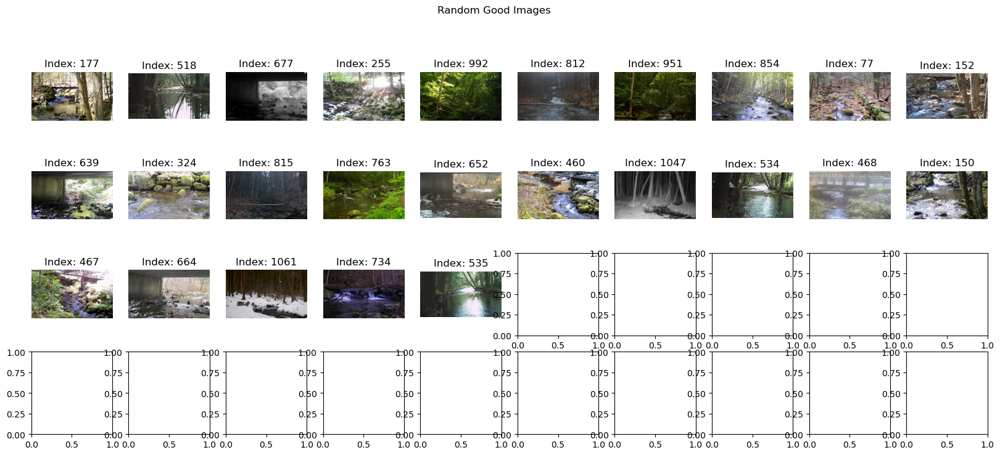

In [100]:
good_indices = [664, 741, 1061, 100, 255, 518, 650, 992, 677, 838, 132, 308, 191, 6, 177, 52, 534, 652, 535, 467, 1047, 710, 504, 102, 200, 460, 773, 854, 324, 300, 639, 812, 867, 77, 763, 152, 150, 182, 404, 951, 468, 815, 458, 1001, 734]
image_properties_df.loc[good_indices, 'image_quality'] = 'good'
good_images = image_properties_df[image_properties_df['image_quality'] == 'good']

random_indices = np.random.choice(good_images.index, size=25, replace=False)
fig, ax = plt.subplots(4,10, figsize=(20,8))
for i, index in enumerate(random_indices):
    ax[i//10,i%10].imshow(open_and_resize_image(good_images.loc[index]['image_paths']))
    ax[i//10,i%10].set_title(f'Index: {index}')
    ax[i//10,i%10].axis('off')
plt.suptitle('Random Good Images')
plt.show()


In [101]:
# train a random forest classifier to predict image quality on 'good' and 'bad' images in the dataset
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

labeled_dataset = image_properties_df.dropna(subset=['image_quality'])
X = labeled_dataset[['c1_mean', 'c2_mean', 'c3_mean', 'var_laplacian', 'haze', 'mal', 'frac_dark', 'frac_light']].values
y = labeled_dataset['image_quality'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

rf = RandomForestClassifier(n_estimators=100, random_state=0)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(confusion_matrix(y_test, y_pred))


Accuracy: 0.8
[[ 6  2]
 [ 2 10]]


In [102]:
# predict on the train set
y_pred_train = rf.predict(X_train)
print(f'Accuracy on train set: {accuracy_score(y_train, y_pred_train)}')
print(confusion_matrix(y_train, y_pred_train))


Accuracy on train set: 1.0
[[43  0]
 [ 0 33]]


In [103]:
# predict on the unlabeled dataset
unlabeled_dataset = image_properties_df[image_properties_df['image_quality'].isna()]
X_unlabeled = unlabeled_dataset[['c1_mean', 'c2_mean', 'c3_mean', 'var_laplacian', 'haze', 'mal', 'frac_dark', 'frac_light']].values
y_unlabeled = rf.predict(X_unlabeled)
n_predicted_good = (y_unlabeled == 'good').sum()
n_predicted_bad = (y_unlabeled == 'bad').sum()
print(f'Number of predicted good images: {n_predicted_good}')
print(f'Number of predicted bad images: {n_predicted_bad}')


Number of predicted good images: 644
Number of predicted bad images: 360


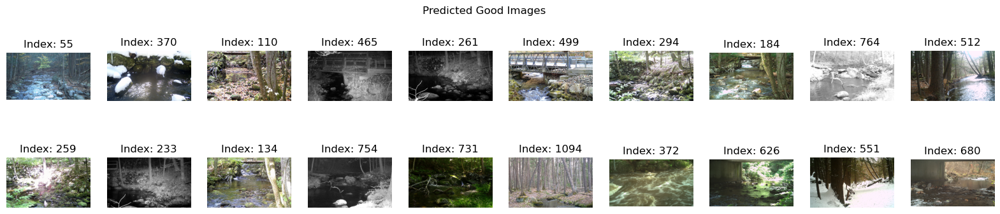

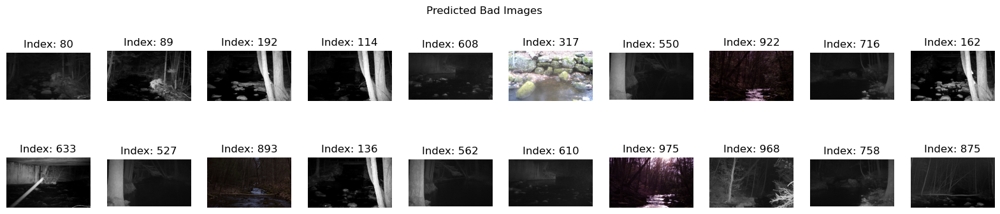

In [104]:
# plot 20 random images predicted good
predicted_good_indices = unlabeled_dataset[y_unlabeled == 'good'].index
random_good_indices = np.random.choice(predicted_good_indices, size=min(20, len(predicted_good_indices)), replace=False)
fig, ax = plt.subplots(2,10, figsize=(20,4))
for i, index in enumerate(random_good_indices):
    ax[i//10,i%10].imshow(open_and_resize_image(unlabeled_dataset.loc[index]['image_paths']))
    ax[i//10,i%10].set_title(f'Index: {index}')
    ax[i//10,i%10].axis('off')
plt.suptitle('Predicted Good Images')
plt.show()

# plot 20 random images predicted bad
predicted_bad_indices = unlabeled_dataset[y_unlabeled == 'bad'].index
random_bad_indices = np.random.choice(predicted_bad_indices, size=min(20, len(predicted_bad_indices)), replace=False)
fig, ax = plt.subplots(2,10, figsize=(20,4))
for i, index in enumerate(random_bad_indices):
    ax[i//10,i%10].imshow(open_and_resize_image(unlabeled_dataset.loc[index]['image_paths']))
    ax[i//10,i%10].set_title(f'Index: {index}')
    ax[i//10,i%10].axis('off')
plt.suptitle('Predicted Bad Images')
plt.show()